## Figure notebook for annotating multiomic (RNA+CITE-seq) datasets (from neurips 2021, S1D1 cite)

Last updated: 1/11/2023

Author: Yang-Joon Kim

Notse: 
- We will use the neurips 2021, s1d1 (RNA+CITE) objects - both RNA and ADT modalities(assays)
- Note that the adata.X is normalized differently for RNA and ADT (RNA is log-normalized, whereas ADT is centered-log-ratio transformed). Raw counts are saved in the "counts" layer.
- We will use a subset of cell-types for UMAP visualizations for simplicity
- [NOT DONE YET] We will generate the whole figure using matplotlib (following Jonathan's Jupyter notebooks).


In [2]:
import os
import pandas as pd
import matplotlib as mpl
from matplotlib import pyplot as plt
import numpy as np
import anndata as ad
import scanpy as sc
import seaborn as sns
from matplotlib_scalebar.scalebar import ScaleBar
from matplotlib.lines import Line2D
#from skimage.measure import block_reduce
import tifffile
import string
from sklearn.metrics import confusion_matrix

mpl.rcParams.update(mpl.rcParamsDefault) #Reset rcParams to default
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']  # Colors in this style

# Plotting style function (run this before plotting the final figure)
def set_plotting_style():
    plt.style.use('seaborn-paper')
    plt.rc('axes', labelsize=12)
    plt.rc('axes', titlesize=12)
    plt.rc('xtick', labelsize=10)
    plt.rc('ytick', labelsize=10)
    plt.rc('legend', fontsize=10)
    plt.rc('text.latex', preamble=r'\usepackage{sfmath}')
    plt.rc('xtick.major', pad=2)
    plt.rc('ytick.major', pad=2)
    plt.rc('mathtext', fontset='stixsans', sf='sansserif')
    plt.rc('figure', figsize=[10,9])
    plt.rc('svg', fonttype='none')
    
def set_plotting_style_huge():
    plt.style.use('seaborn-paper')
    plt.rc('axes', labelsize=24)
    plt.rc('axes', titlesize=24)
    plt.rc('xtick', labelsize=20)
    plt.rc('ytick', labelsize=20)
    plt.rc('legend', fontsize=20)
    plt.rc('text.latex', preamble=r'\usepackage{sfmath}')
    plt.rc('xtick.major', pad=4)
    plt.rc('ytick.major', pad=4)
    plt.rc('mathtext', fontset='stixsans', sf='sansserif')
    plt.rc('figure', figsize=[10,9])
    plt.rc('svg', fonttype='none')

In [4]:
# load utilities module
import sys
sys.path.append("/mnt/ibm_lg/yangjoon.kim/excellxgene_tutorial_manuscript/celltype_annotation_tutorial/utilities/")
import color_schema

In [5]:
# define the figure path
figpath = "/mnt/ibm_lg/yangjoon.kim/excellxgene_tutorial_manuscript/celltype_annotation_tutorial/figures/Figure_RNA_CITE_multiome/"
sc.settings.figdir = figpath
set_plotting_style()

## Figure scheme

- (A): 
- (B): 
- (C): 
- (D):
- (E):


In [6]:
# marker genes for RNA
marker_genes = {
    'CD14+ Mono': ['FCN1', 'CD14'],
    'CD16+ Mono': ['TCF7L2', 'FCGR3A', 'LYN'],
    'ID2-hi myeloid prog': ['CD14', 'ID2', 'VCAN', 'FOS', 'JUN', 'EGR1', 'KLF4', 'PLAUR'],
    'cDC1': ['CLEC9A', 'CADM1'],
    'cDC2': ['CLEC10A', 'FCER1A', 'CST3', 'COTL1', 'LYZ', 'DMXL2'], # Note: DMXL2 should be negative
    'Reticulocyte': ['SLC4A1', 'SLC25A37', 'HBB', 'HBA2', 'HBA1', 'TFRC'], # TFRC negative
    'Normoblast': ['SLC4A1', 'SLC25A37', 'HBB', 'HBA2', 'HBA1', 'TFRC'],  # TFRC positive
    'Erythroblast': ['MKI67', 'HBA1', 'HBB'],
    'Proerythroblast': ['CDK6', 'SYNGR1', 'HBM', 'GYPA'], # Note HBM and GYPA are negative markers   # CRACD as well, but not present in data
    'NK': ['GNLY', 'NKG7', 'CD247', 'FCER1G', 'TYROBP', 'KLRG1', 'FCGR3A'], # GRIK4 as well, but not present in data
    'ILC': ['ID2', 'PLCG2', 'GNLY', 'SYNE1'],
    'Lymph prog': ['IGLL1', 'VPREB1', 'MME', 'EBF1', 'SSBP2', 'BACH2', 'CD79B', 'IGHM', 'PAX5', 'PRKCE', 'DNTT'],  # new: STMN1
    'Naive CD20+ B - IGKC+':['MS4A1', 'IL4R', 'IGHD', 'FCRL1', 'IGHM', 'IGKC'],
    'Naive CD20+ B - IGKC-':['MS4A1', 'IL4R', 'IGHD', 'FCRL1', 'IGHM', 'IGKC'], # IGKC negative
    'B1 B - IGKC+':['MS4A1', 'SSPN', 'ITGB1','IGKC', 'EPHA4', 'COL4A4', 'PRDM1', 'IRF4', 'CD38', 'XBP1', 'PAX5', 'BCL11A', 'BLK', 'IGHD', 'IGHM'],# Note IGHD and IGHM are negative markers #ZNF215 not in data
    'B1 B - IGKC-':['MS4A1', 'SSPN', 'ITGB1', 'EPHA4', 'COL4A4', 'PRDM1', 'IRF4', 'CD38', 'XBP1', 'PAX5', 'BCL11A', 'BLK', 'IGHD', 'IGHM', 'IGKC'],# Note IGKC, IGHD and IGHM are negative markers #ZNF215 not in data
    'Transitional B': ['MME', 'CD38', 'CD24', 'ACSM3', 'MSI2'],
    'Plasma cell': ['MZB1', 'HSP90B1', 'FNDC3B', 'PRDM1', 'IGKC', 'JCHAIN'],
    'Plasmablast': ['XBP1', 'PRDM1', 'PAX5'],  # Note PAX5 is a negative marker   # RF4 as well, but not present in data
    'CD4+ T activated': ['CD4', 'IL7R', 'TRBC2', 'ITGB1'],
    'CD4+ T naive': ['CD4', 'IL7R', 'TRBC2', 'CCR7'],
    'CD8+ T': ['CD8A', 'CD8B', 'GZMB', 'GZMA', 'CCL5', 'GZMK', 'GZMH', 'GZMA'],
    'T activation': ['CD69', 'CD38'], # CD69 much better marker!
    'T naive': ['LEF1', 'CCR7', 'TCF7'],
    'T reg': ['FOXP3'],
    'Effector CD4+ T': ['KLRB1', 'CD4', 'PDCD1', 'TNF'],
    'Effector CD8+ T': ['KLRK1', 'GZMH', 'CD8A', 'CD8B'],
    'MAIT': ['KLRB1', 'CD8A', 'GZMK', 'IL7R'],
    'gdT': ['KLRC2', 'KLRF1', 'FCGR3A', 'GZMB', 'GZMH'],
    'pDC': ['GZMB', 'IL3RA', 'COBLL1', 'TCF4'],
    'G/M prog': ['MPO', 'BCL2', 'KCNQ5', 'CSF3R', 'PRTN3'], 
    'HSC': ['NRIP1', 'MECOM', 'PROM1', 'CD34', 'NKAIN2'], 
    'MK/E prog': ['ZNF385D', 'ITGA2B', 'PLCB1'], # 'RYR3' as well,  but not present in data
}


In [9]:
# markers for ADT
high_level_markers = {
    'Erythro linage' : ['CD71'],
    'CD4+ T' : ['CD4'],
    'CD8+ T' : ['CD8'],
    'B': ['CD40', 'CD19'],
    'Mono':['CD11b'],
    'Progen':['CD112']
}

marker_prots = {
    
    'CD14+ Mono': ['CD14', 'CD11b', 'CD62P'],
    'CD16+ Mono': ['CD85j', 'CD11c', 'CD172a', 'CD88'],
    'cDC2': ['CD1c', 'FceRIa', 'CD11c'],
    'pDC': ['CD303', 'CD304'], 
    
    #Ery linage
    'Proerythroblast': ['CD105'],
    'Erythroblast': ['CD82', 'CD71'], # CD82 also in B
    'Normoblast/Reticulocyte': ['CD71'], 

    # B linage
    'naive CD20+ B': ['IgD'],
    'B1 B': ['CD40', 'CD35', 'CD268', 'IgD'], # (IgD- !)
    'transitional B': ['CD38', 'CD24'], # 'CD24', 'CD81', 'CD9'
    'Plasma cell': ['CD63', 'CD319'], 
    'Plasmablast': ['CD39', 'CD319'], # CD86
    
    #NK
    'NK': ['CD56', 'CD94', 'CD335'],  # 'CD57'?
    'NK CD158e1+':['CD158e1'],
    
    # Progenitors
    'MK/E prog':['CD105', 'CD112', 'CD352'],
    'HSC': ['CD112', 'CD13', 'CD155'],
    'Lymph prog':['CD112', 'CD81'], # close to HSC
    'G/M prog':['CD112', 'CD86'],
    
    #CD4
    'CD4+ T naive':['CD45RA','CD4'], # close to HSC
    'T reg':['CD25', 'CD39', 'CD4'],
    'CD4+ T activated':['CD45RO','CD4'], # none of CD279+, CD194+, integrinB7+, CD314+
    'CD4+ T activated CD279+':['CD279','CD45RO','CD4', 'CD25'], #CD25 negative
    'CD4+ T activated CD194+':['CD194','CD45RO','CD4'],
    'CD4+ T activated integrinB7+':['integrinB7','CD45RO','CD4'],
    'CD4+ T CD314+ CD45RA+':['CD11c','CD314','CD45RA','CD4'], # 'CD11c' negative
    
    # CD8, gdT and other
    'CD8+ T naive CD127+ CD26+ CD101+':['CD127','CD26','CD101','CD45RA','CD8'],
    'CD8+ T naive CD127+ CD26- CD101-':['CD127','CD26','CD101','CD45RA','CD8'],
    
    'ILC1':['CD103', 'CD127'],
    'MAIT':['TCRVa7.2', 'CD8'],
    'gdT TCRVD2+':['TCRVd2','CD161'],
    
    'gdT CD56+':['CD56','CD158b'],
    'gdT Vd1 CD57+':['CD57','CD158b'],
    'gdT CD158b+ CD11c+':['CD158b','CD11c'],
    
    'CD8 T CD49f+':['CD49f','CD226', 'CD45RO'], # only CD45RO+
    'CD8 T CD57+ CD45RO+':['CD57', 'CD45RO'], # CD56-
    'CD8 T CD57+ CD45RA+':['CD57','CD56', 'CD45RA'],
    'CD8 T TIGIT+ CD45RO+':['TIGIT','CD45RO'], # also CD226-
    'CD8 T TIGIT+ CD45RA+':['TIGIT','CD45RA'], #
    'CD8 T CD69+ CD45RO+':['CD69','CD45RO'], # also CD226-
    'CD8 T CD69+ CD45RA+':['CD69','CD45RA'], # 
}

In [10]:
marker_genes["CD4+ T activated"]
marker_genes["CD4+ T naive"]

['CD4', 'IL7R', 'TRBC2', 'CCR7']

# Annotation/Exploration using exCellxgene - T cells and erythroblast populations only

- last updated: 1/13/2023

Here, the annotation was originally done for all fine-grained cell-types by the neurips annotation team.
For visualization, we will merge some fine-grained annotations to make a "coarse" annotation named "manual_annotation". (Basically, merging some sub-populations identified using the surface protein markers).
- Coarse - manual_annotation
- Fine - cell_type (done by the neurips annotators)

In [41]:
adata = sc.read_h5ad("/mnt/ibm_lg/yangjoon.kim/excellxgene_tutorial_manuscript/data/neurips2021_cite/s1d1_gex_cite_joint_normalized_per_assay_reannotated.h5ad")
adata

AnnData object with n_obs × n_vars = 5227 × 14087
    obs: 'name_0', 'GEX_n_genes_by_counts', 'GEX_pct_counts_mt', 'GEX_size_factors', 'GEX_phase', 'ADT_n_antibodies_by_counts', 'ADT_total_counts', 'ADT_iso_count', 'cell_type', 'batch', 'ADT_pseudotime_order', 'GEX_pseudotime_order', 'Samplename', 'Site', 'DonorNumber', 'Modality', 'VendorLot', 'DonorID', 'DonorAge', 'DonorBMI', 'DonorBloodType', 'DonorRace', 'Ethnicity', 'DonorGender', 'QCMeds', 'DonorSmoker', 'is_train', 'manual_annotation', 'coarse_annotation'
    var: 'name_0', 'feature_types', 'mean', 'variance'
    obsm: 'X_ADT_X_pca', 'X_ADT_X_umap', 'X_GEX_X_pca', 'X_GEX_X_umap', 'X_latent_ADT_X_pca', 'X_latent_GEX_X_pca'
    layers: 'X', 'counts'

In [43]:
# coarse annotation (for T cells and erythroblast developoment populations only)
adata.obs["coarse_annotation"].unique()

['unassigned', 'T cells', 'erythroblast_development']
Categories (3, object): ['T cells', 'erythroblast_development', 'unassigned']

In [44]:
# coarse annotation (for T cells only)
adata.obs["manual_annotation"].unique()

['unassigned', 'CD4+ T naive', 'B1 B', 'CD4+ T activated', 'MAIT', 'CD8+ T', 'T reg', 'gdT', 'ILC']
Categories (9, object): ['B1 B', 'CD4+ T activated', 'CD4+ T naive', 'CD8+ T', ..., 'MAIT', 'T reg', 'gdT', 'unassigned']

In [13]:
# fine annotation by the neurips annotator team
adata.obs["cell_type"].unique()

['Naive CD20+ B IGKC+', 'CD14+ Mono', 'HSC', 'Reticulocyte', 'Normoblast', ..., 'G_M prog', 'MK_E prog', 'Plasmablast IGKC-', 'Plasma cell IGKC+', 'Plasma cell IGKC-']
Length: 37
Categories (37, object): ['B1 B IGKC+', 'B1 B IGKC-', 'CD14+ Mono', 'CD16+ Mono', ..., 'Transitional B', 'cDC2', 'gdT TCRVD2+', 'pDC']

In [35]:
# redefine the color dict for the manual_annotation
# Note: We can always come back and change the color scheme. Maybe Ask Alejandro if he has a preferred set of colors
# It would be challenging to make this consistent with exCellxgene colorset, but definitely an option to try.
# adata.uns["manual_annotation_colors"] = ['#1f77b4', '#ff7f0e', '#2ca02c', 
#                                          '#d62728', '#9467bd', '#8c564b', 
#                                          '#e377c2', '#bcbd22', '#A9A9A9']

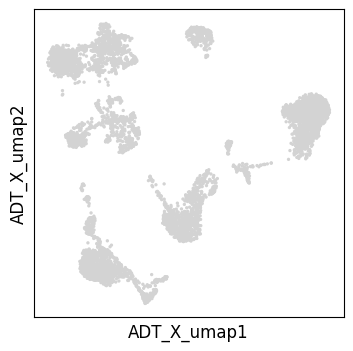

In [17]:
# plot the UMAP without any labels
with plt.rc_context({"figure.figsize": (4, 4), "figure.dpi": (100)}):
    sc.pl.embedding(adata, basis="ADT_X_umap" ,legend_fontsize=8)

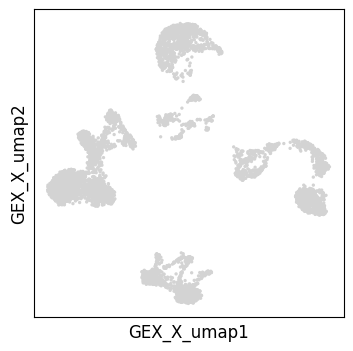

In [18]:
# plot the UMAP without any labels
with plt.rc_context({"figure.figsize": (4, 4), "figure.dpi": (100)}):
    sc.pl.embedding(adata, basis="GEX_X_umap" ,legend_fontsize=8)

### marker genes for T-cell subtypes (RNA)

- 'CD4+ T': ['CD4', 'IL7R', 'TRBC2']
- 'CD8+ T': ['CD8A', 'CD8B', 'GZMB', 'GZMA', 'CCL5', 'GZMK', 'GZMH', 'GZMA']
- 'ILC': ['ID2', 'PLCG2', 'GNLY', 'SYNE1']
- 'NK': ['GNLY', 'NKG7', 'CD247', 'GRIK4', 'FCER1G', 'TYROBP', 'KLRG1', 'FCGR3A']

### marker genes for T-cell subtypes (ADT)
- 'CD4+ T': ['CD4']
- 'CD8+ T': ['CD8']
- 'ILC': ['CD103', 'CD127']
- 'NK': ['CD56','CD94', 'CD335']
- 'MAIT':['TCRVa7.2', 'CD8']


## markers that I chose for visualization and further exploration
- "CD4+ T": ["CD4-RNA", "CD4-ADT"]
- "CD8+ T": ["CD8A-RNA", "CD8-ADT"]
- "NK": ["GNLY-RNA","CD56-ADT"]

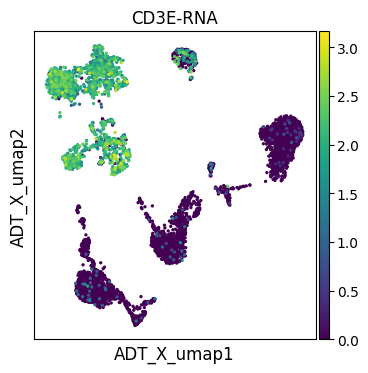

In [32]:
# marker for pan T-cell
with plt.rc_context({"figure.figsize": (4, 4), "figure.dpi": (100)}):
    sc.pl.embedding(adata, basis="ADT_X_umap", color="CD3E-RNA")

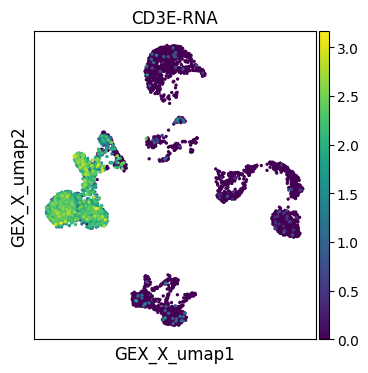

In [35]:
# marker for pan T-cell
with plt.rc_context({"figure.figsize": (4, 4), "figure.dpi": (100)}):
    sc.pl.embedding(adata, basis="GEX_X_umap", color="CD3E-RNA")

In [33]:
# thresholding for CD3E-RNA expression
adata_Tcells = adata[adata[:,adata.var_names=="CD3E-RNA"].X.todense()>2.0]
adata_Tcells

View of AnnData object with n_obs × n_vars = 591 × 14087
    obs: 'name_0', 'GEX_n_genes_by_counts', 'GEX_pct_counts_mt', 'GEX_size_factors', 'GEX_phase', 'ADT_n_antibodies_by_counts', 'ADT_total_counts', 'ADT_iso_count', 'cell_type', 'batch', 'ADT_pseudotime_order', 'GEX_pseudotime_order', 'Samplename', 'Site', 'DonorNumber', 'Modality', 'VendorLot', 'DonorID', 'DonorAge', 'DonorBMI', 'DonorBloodType', 'DonorRace', 'Ethnicity', 'DonorGender', 'QCMeds', 'DonorSmoker', 'is_train', 'manual_annotation'
    var: 'name_0', 'feature_types', 'mean', 'variance'
    obsm: 'X_ADT_X_pca', 'X_ADT_X_umap', 'X_GEX_X_pca', 'X_GEX_X_umap', 'X_latent_ADT_X_pca', 'X_latent_GEX_X_pca'
    layers: 'X', 'counts'

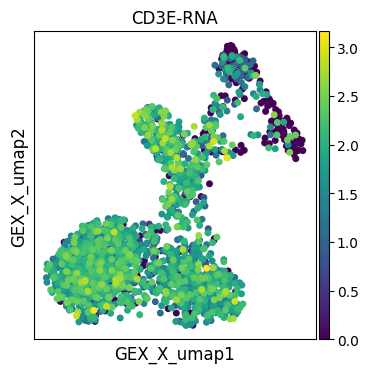

In [53]:
# marker for pan T-cell
with plt.rc_context({"figure.figsize": (4, 4), "figure.dpi": (100)}):
    sc.pl.embedding(adata[adata.obs.coarse_annotation=="T cells"], 
                    basis="GEX_X_umap", color="CD3E-RNA", size=100,
                    save="_Tcells_GEX_CD3E-RNA.pdf")

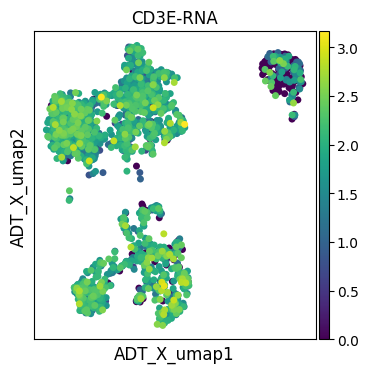

In [52]:
# marker for pan T-cell
with plt.rc_context({"figure.figsize": (4, 4), "figure.dpi": (100)}):
    sc.pl.embedding(adata[adata.obs.coarse_annotation=="T cells"], 
                    basis="ADT_X_umap", color="CD3E-RNA", size=100,
                    save="_Tcells_ADT_CD3E-RNA.pdf")

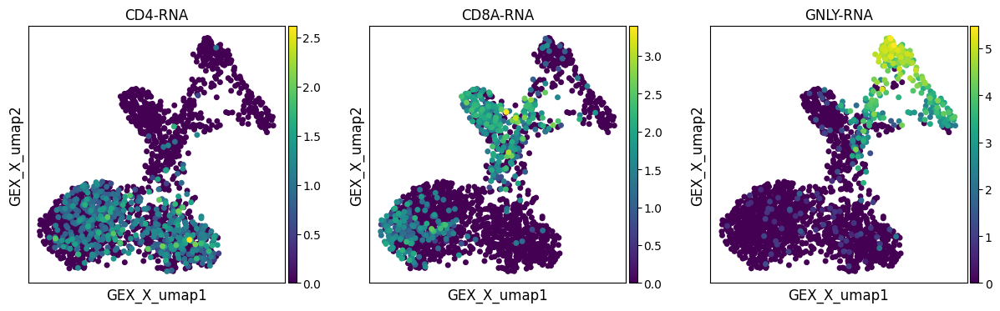

In [51]:
# marker genes for T cell subtypes (CD4, CD8A, GNLY, for CD4 T, CD8 T, or NK cells, respectively)
# RNA(GEX) UMAP
with plt.rc_context({"figure.figsize": (4, 4), "figure.dpi": (100)}):
    sc.pl.embedding(adata[adata.obs.coarse_annotation=="T cells"], 
                    basis="GEX_X_umap", color=["CD4-RNA","CD8A-RNA","GNLY-RNA"], size=100, ncols=3,
                    save="_Tcells_GEX_Tcell_subtype_RNA_markers.pdf")

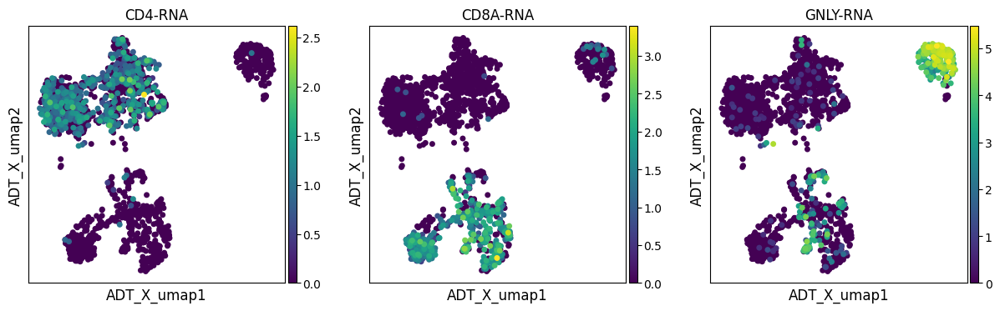

In [55]:
# marker genes for T cell subtypes (CD4, CD8A, GNLY, for CD4 T, CD8 T, or NK cells, respectively)
# ADT UMAP
with plt.rc_context({"figure.figsize": (4, 4), "figure.dpi": (100)}):
    sc.pl.embedding(adata[adata.obs.coarse_annotation=="T cells"], 
                    basis="ADT_X_umap", color=["CD4-RNA","CD8A-RNA","GNLY-RNA"], size=100, ncols=3,
                    save="_Tcells_ADT_Tcell_subtype_RNA_markers.pdf")

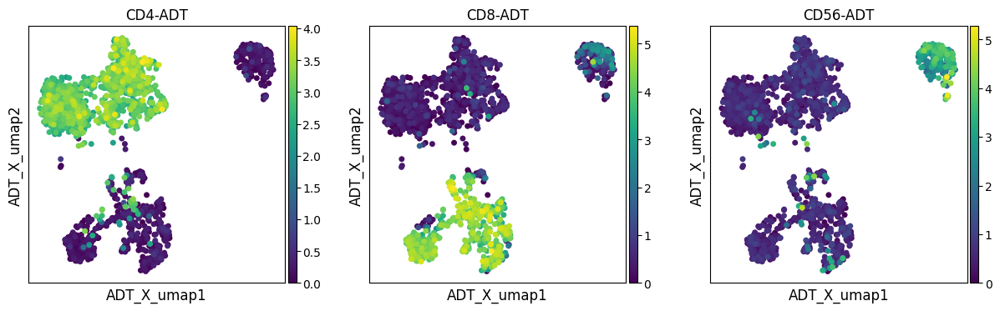

In [54]:
# marker "surface proteins" for T cell subtypes (CD4, CD8, CD56, for CD4 T, CD8 T, or NK cells, respectively)
# ADT UMAP
with plt.rc_context({"figure.figsize": (4, 4), "figure.dpi": (100)}):
    sc.pl.embedding(adata[adata.obs.coarse_annotation=="T cells"], 
                    basis="ADT_X_umap", color=["CD4-ADT","CD8-ADT","CD56-ADT"], size=100, ncols=3,
                    save="_Tcells_ADT_Tcell_subtype_ADT_markers.pdf")

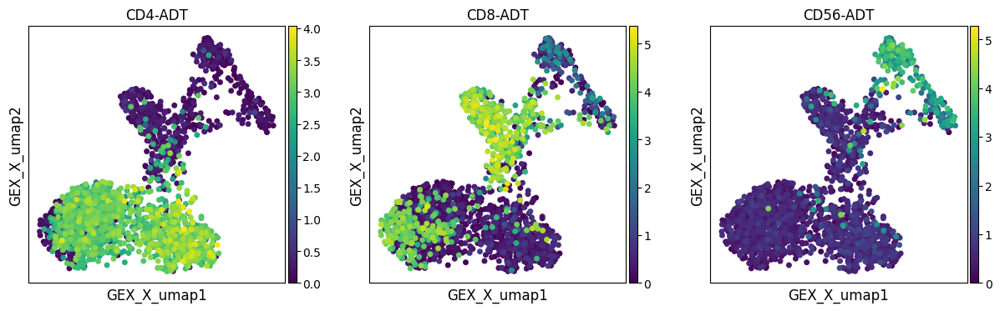

In [56]:
# marker "surface proteins" for T cell subtypes (CD4, CD8, CD56, for CD4 T, CD8 T, or NK cells, respectively)
# RNA(GEX) UMAP
with plt.rc_context({"figure.figsize": (4, 4), "figure.dpi": (100)}):
    sc.pl.embedding(adata[adata.obs.coarse_annotation=="T cells"], 
                    basis="GEX_X_umap", color=["CD4-ADT","CD8-ADT","CD56-ADT"], size=100, ncols=3,
                    save="_Tcells_GEX_Tcell_subtype_ADT_markers.pdf")

# Correlation between RNA and ADT expression levels

In [72]:
# extract the count matrix (cells x (RNA+ADT), normalized for each modality independently with each other.)
df = pd.DataFrame(index=adata.obs_names,
                  columns=adata.var_names,
                  data = adata.X.todense())
df

,AL627309.5-RNA,LINC01409-RNA,LINC01128-RNA,LINC00115-RNA,FAM41C-RNA,NOC2L-RNA,KLHL17-RNA,HES4-RNA,ISG15-RNA,AGRN-RNA,...,CD94-ADT,CD162-ADT,CD85j-ADT,CD23-ADT,CD328-ADT,HLA-E-ADT,CD82-ADT,CD101-ADT,CD88-ADT,CD224-ADT
GCATTAGCATAAGCGG-1-s1d1,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,...,0.151638,0.275544,0.357243,0.802581,0.212457,0.531909,0.462102,0.056784,0.325123,0.312179
TACAGGTGTTAGAGTA-1-s1d1,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,...,0.905696,2.097850,1.552089,1.514912,3.195998,1.069881,0.448301,2.254477,0.705340,2.360822
AGGATCTAGGTCTACT-1-s1d1,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,...,0.151638,0.242905,0.619913,0.769582,0.000000,0.765012,1.259504,0.000000,0.325123,0.257057
GTAGAAAGTGACACAG-1-s1d1,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,...,0.000000,1.227028,0.357243,0.254422,3.466028,0.568724,0.345970,0.496338,0.293797,3.481558
TCCGAAAAGGATCATA-1-s1d1,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,...,0.503775,0.156318,0.827744,0.700126,0.000000,0.604232,0.214558,0.256295,2.090179,0.461366
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
GTCGAATAGTTTCGGT-1-s1d1,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,...,0.000000,0.322588,0.999725,0.834526,0.212457,0.794283,0.835231,0.210024,0.384976,0.000000
AGTAGTCTCTGGGCGT-1-s1d1,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,...,0.151638,0.950203,0.539786,0.501903,0.387590,1.069881,0.725631,1.518207,0.261458,2.502404
GCCCGAAGTATGGAGC-1-s1d1,0.0,0.0,0.000000,0.0,0.0,0.895706,0.0,0.0,0.000000,0.0,...,1.086833,1.354899,0.133768,0.501903,0.212457,0.929020,0.515473,0.597723,0.228038,0.591158
CTACATTAGCGCGTTC-1-s1d1,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,...,0.763687,2.432257,1.884336,1.360248,3.466028,0.929020,1.444944,2.925572,2.035944,2.101866


In [87]:
adata.obs.manual_annotation

GCATTAGCATAAGCGG-1-s1d1          unassigned
TACAGGTGTTAGAGTA-1-s1d1          unassigned
AGGATCTAGGTCTACT-1-s1d1          unassigned
GTAGAAAGTGACACAG-1-s1d1          unassigned
TCCGAAAAGGATCATA-1-s1d1          unassigned
                                 ...       
GTCGAATAGTTTCGGT-1-s1d1          unassigned
AGTAGTCTCTGGGCGT-1-s1d1    CD4+ T activated
GCCCGAAGTATGGAGC-1-s1d1        CD4+ T naive
CTACATTAGCGCGTTC-1-s1d1          unassigned
GATTCTTTCACCCATC-1-s1d1          unassigned
Name: manual_annotation, Length: 5227, dtype: category
Categories (9, object): ['B1 B', 'CD4+ T activated', 'CD4+ T naive', 'CD8+ T', ..., 'MAIT', 'T reg', 'gdT', 'unassigned']

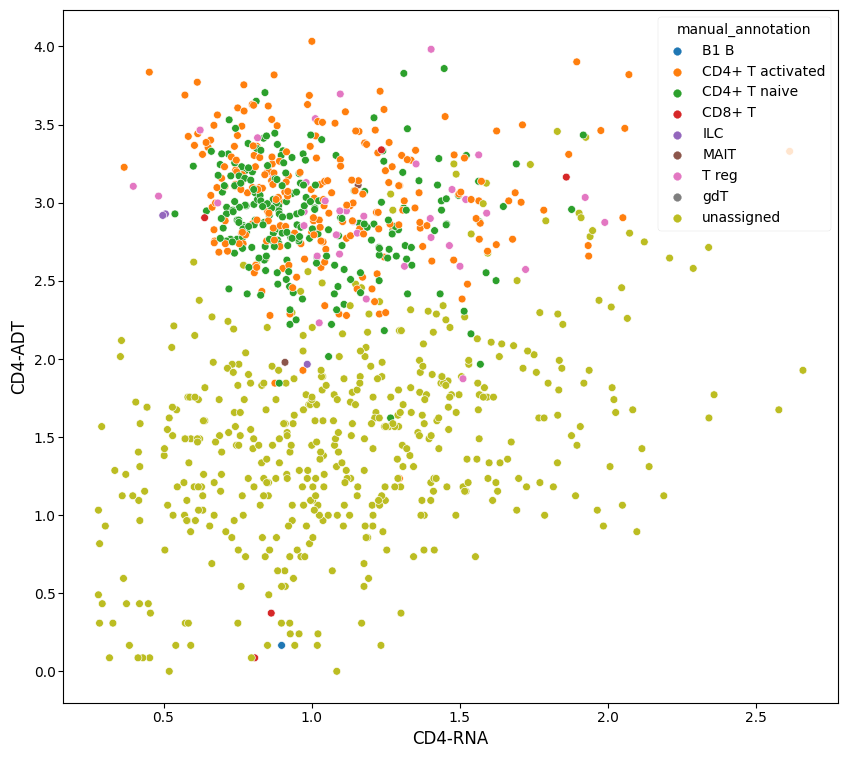

In [97]:
plt.rc_context({"figure.figsize": (4,4), "figure.dpi": (100)})

df_filtered = df[df["CD4-RNA"]!=0]
sns.scatterplot(data=df_filtered,
                x="CD4-RNA",
                y="CD4-ADT", hue=adata.obs.manual_annotation)
# sns.scatterplot(data=df_filtered[adata.obs.coarse_annotation=="T cells"],
#                 x="CD4-RNA",
#                 y="CD4-ADT")
# sns.scatterplot(data=df_filtered[adata.obs.manual_annotation.isin(["CD4+ T activated","CD4+ T naive"])],
#                 x="CD4-RNA",
#                 y="CD4-ADT")
plt.show()


In [71]:
np.transpose()

,CD4_RNA
GCATTAGCATAAGCGG-1-s1d1,34
TACAGGTGTTAGAGTA-1-s1d1,34
AGGATCTAGGTCTACT-1-s1d1,34
GTAGAAAGTGACACAG-1-s1d1,34
TCCGAAAAGGATCATA-1-s1d1,34
...,...
GTCGAATAGTTTCGGT-1-s1d1,34
AGTAGTCTCTGGGCGT-1-s1d1,34
GCCCGAAGTATGGAGC-1-s1d1,34
CTACATTAGCGCGTTC-1-s1d1,34


In [66]:
adata[:,adata.var_names=="CD4-ADT"].X.todense()

matrix([[0.08642262],
        [1.6217647 ],
        [0.        ],
        ...,
        [3.4329753 ],
        [1.5854487 ],
        [0.77632546]], dtype=float32)

## Check the erythroblast development population 

Better-resolved in RNA(GEX) than ADT(CITE)

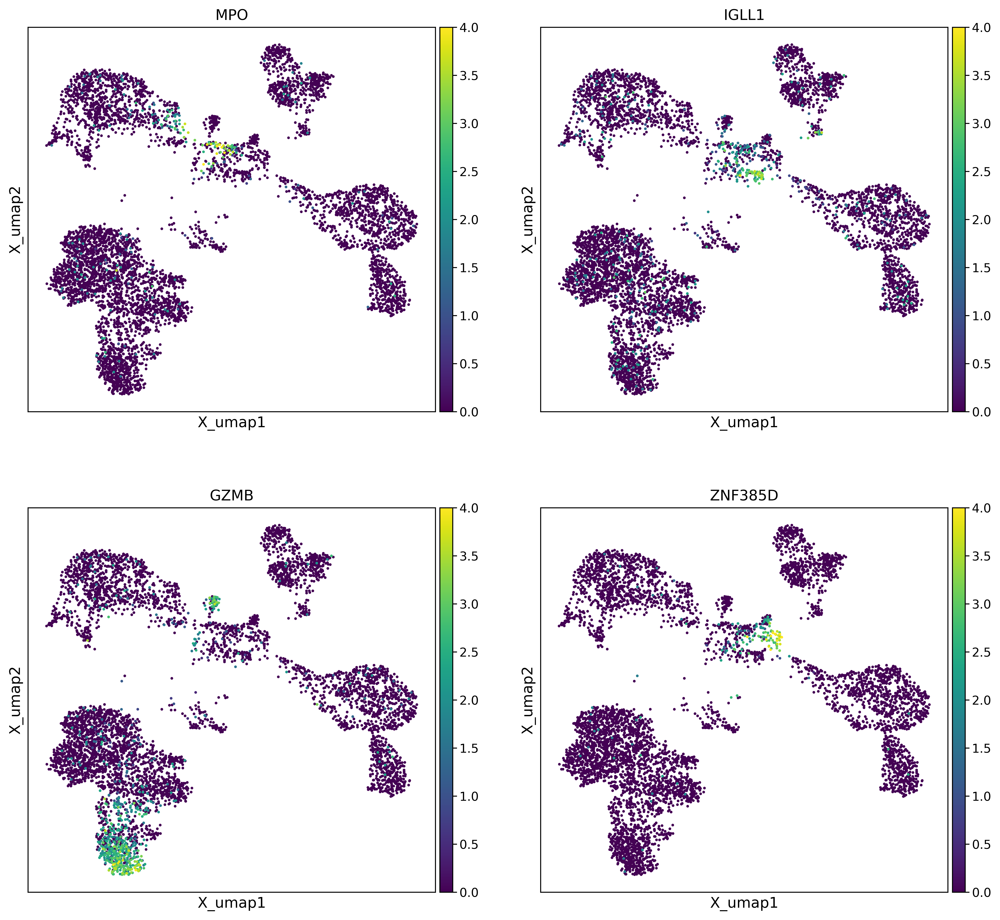

In [65]:
# Checking the progenitor population
# dissection for the T-cell subtypes
with plt.rc_context({"figure.figsize": (6,6), "figure.dpi": (300)}):
    sc.pl.embedding(adata, 
                    basis="X_umap", 
                    color=["MPO","IGLL1","GZMB","ZNF385D"], 
                    vmin=[0, 0, 0, 0],
                    vmax=[4, 4, 4, 4],
                    ncols=2)

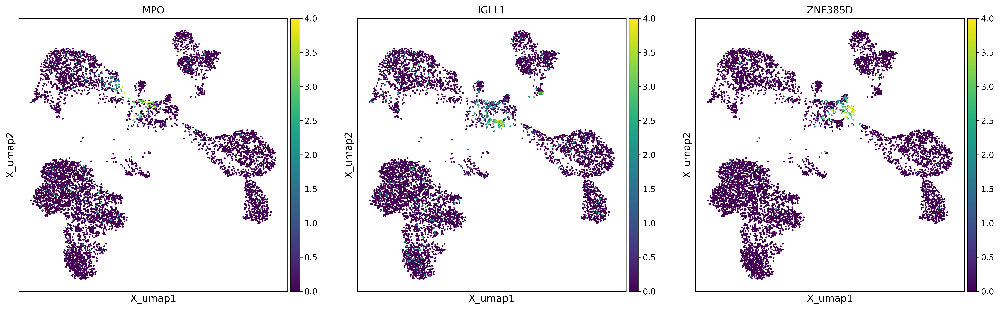

In [67]:
# Checking the progenitor population
# dissection for the T-cell subtypes
with plt.rc_context({"figure.figsize": (6,6), "figure.dpi": (300)}):
    sc.pl.embedding(adata, 
                    basis="X_umap", 
                    color=["MPO","IGLL1","ZNF385D"], 
                    vmin=[0, 0, 0],
                    vmax=[4, 4, 4],
                    ncols=3)

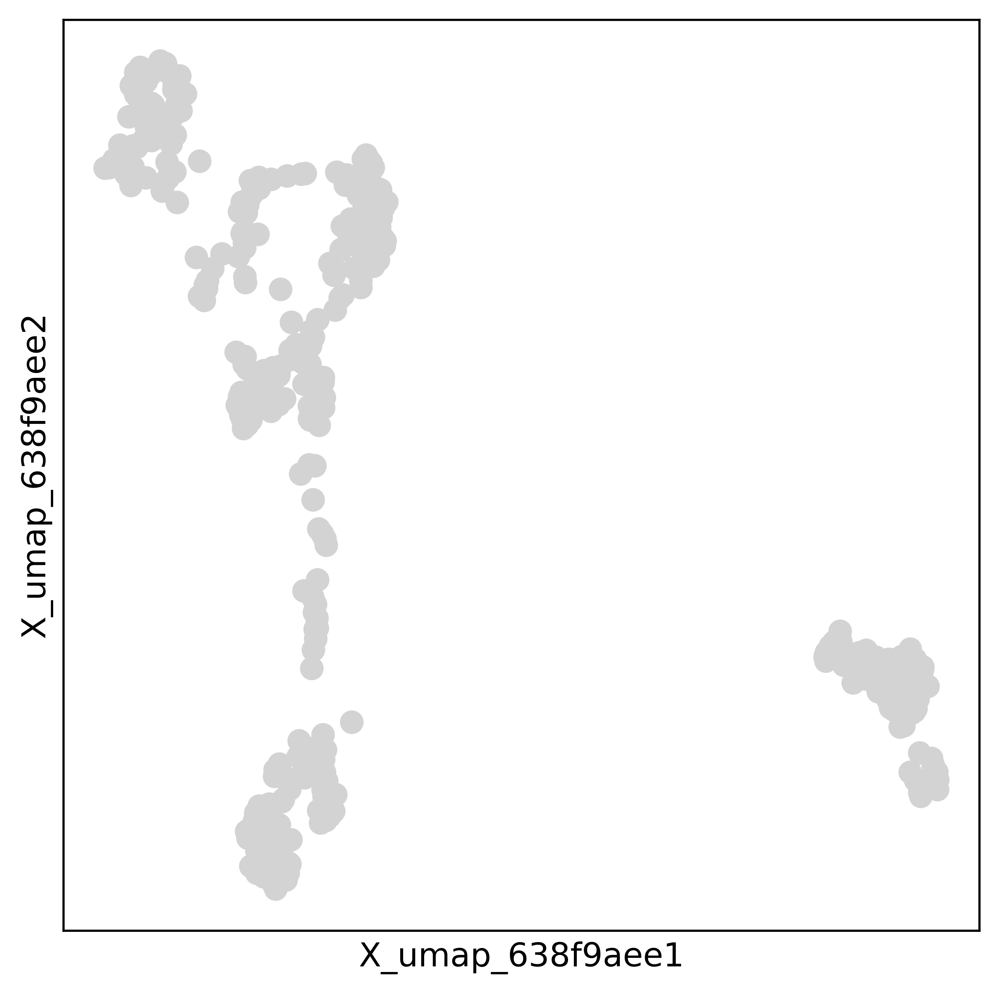

In [72]:
# Checking the progenitor population
with plt.rc_context({"figure.figsize": (6,6), "figure.dpi": (300)}):
    sc.pl.embedding(adata_prog, 
                    basis="X_umap_638f9aee")

In [73]:
adata_prog.obs["cells"] = "progenitors"
adata_prog

AnnData object with n_obs × n_vars = 404 × 17739
    obs: 'name_0', 'n_genes_by_counts', 'pct_counts_mt', 'n_counts', 'n_genes', 'size_factors', 'phase', 'leiden_final', 'atac_ann', 'cell_type', 'pseudotime_order_GEX', 'manual_annotation', 'cells'
    var: 'name_0', 'gene_ids', 'feature_types', 'genome', 'n_cells', 'highly_variable', 'mean', 'variance'
    uns: 'N_umap_638f9aee_params'
    obsm: 'X_latent_pca', 'X_umap_638f9aee'
    layers: 'X', 'counts'
    obsp: 'N_umap_638f9aee'

In [75]:
# Checking the progenitor population
with plt.rc_context({"figure.figsize": (6,6), "figure.dpi": (300)}):
    sc.pl.embedding(adata_prog, 
                basis="X_umap_638f9aee", 
                color=["cells","MPO","IGLL1","GZMB","ZNF385D","NRIP1"], 
                vmin=[0,0, 0, 0, 0, 0],
                vmax=[0,4, 4, 4, 4, 4],
                ncols=3)

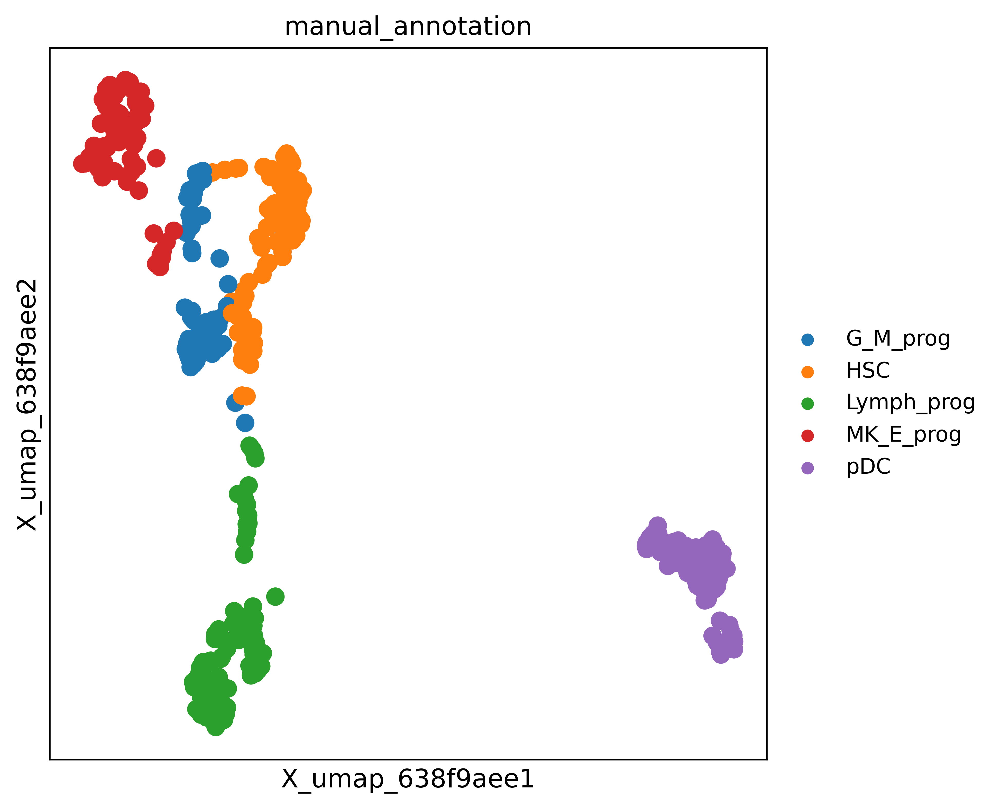

In [76]:
# Checking the progenitor population
with plt.rc_context({"figure.figsize": (6,6), "figure.dpi": (300)}):
    sc.pl.embedding(adata_prog, 
                basis="X_umap_638f9aee", 
                color=["manual_annotation"])

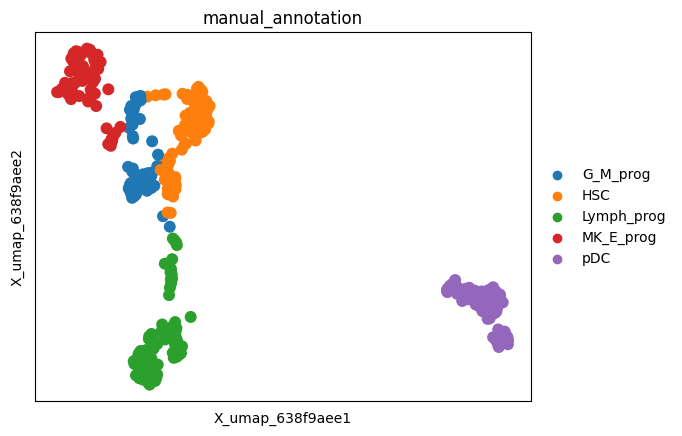

In [126]:
sc.pl.embedding(adata_test, basis="X_umap_638f9aee", color="manual_annotation")

# Combine all panels into one large figure

In [ ]:
sc.set_figure_params(vector_friendly=True, dpi=300, dpi_save=2000)
mpl.rcParams.update(mpl.rcParamsDefault) #Reset rcParams to default
set_plotting_style_huge()

fig2 = plt.figure(figsize=(20,26), constrained_layout=True) # Create figure
subfigs = fig2.subfigures(5,1, height_ratios=[0.5, 0.5, 1, 1, 1]) # Create subfigures (each row)
axes0 = subfigs[0].subplots(1,3) # Axes for the subfigure 1
axes1 = subfigs[1].subplots(1,3) # Axes for the subfigure 2
axes2 = subfigs[2].subplots(1,3) # Axes for the subfigure 3
axes3 = subfigs[3].subplots(2,3) # Axes for the subfigure 4
axes4 = subfigs[4].subplots(1,1) # Axes for the subfigure 5

# # remove the underlying axes for the spatial panel and the last panel
# gs = axes1[0,0].get_gridspec() #Get gridspecs
# for i in [0,1]:
#     for j in [0,1]:
#         axes1[i,j].remove()
# for i in [2]:
#     for j in [0,1,2]:
#         axes1[i,j].remove()

# axbig1 = subfigs[1].add_subplot(gs[0:2, 0:2])
# axbig2 = subfigs[1].add_subplot(gs[2, 0:2])
# axbig3 = subfigs[1].add_subplot(gs[2, 2:4])

# Panel A: UMAP
ax = axes0[0]
sc.pl.umap(adata, ax=ax, show=False, legend_loc='on data',
           frameon=True, size=20)

ax = axes0[1]
sc.pl.umap(VizgenLiver, color='ptprb', ax=ax, show=False, legend_loc=None,
          frameon=True, size=20)

ax = axes0[2]
sc.pl.umap(adata, color = "CD3E", ax=ax, show=False, legend_loc='on data',
           frameon=True, size=20)


